In [34]:
%matplotlib inline

import os
import pickle
import cv2
import matplotlib
from matplotlib import pyplot as plt
import sklearn
import numpy as np
import pandas as pd

In [35]:
def read_pickled_image(pickled_image):
    with open(pickled_image, "rb") as img_p:
        img_data = pickle.load(img_p)
        return img_data        


def load_images(pickled_directory):
    images = dict()
    for file in os.listdir(pickled_directory):
        with open(pickled_directory+file, "rb") as img_p:
            img_data = pickle.load(img_p)
            images[file] = img_data
    return images

def display_rgb_image(image_rgb_data):
    image_rgb_data = image_rgb_data.astype('uint8')
    plt.imshow(image_rgb_data)
    plt.show(block=False)

pickled_directory = "/Users/Sai/Desktop/VideoSynopsis/CSCI576ProjectMedia/Image/RGB_Pickled/"
images = load_images(pickled_directory)


In [36]:
img = "image-0326.rgb.p"
image = images[img]

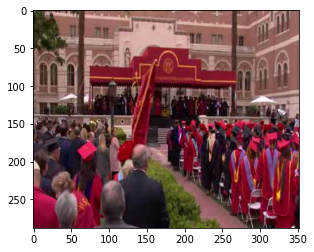

In [37]:
display_rgb_image(image)

In [38]:
X = []
for image in images:
    X.append(images[image])
len(X)
X[0].shape


(288, 352, 3)

In [39]:
from sklearn.cluster import KMeans
X = np.array(X)
X = X.reshape(X.shape[0], -1)
kmeans = KMeans(n_clusters=20).fit(X)


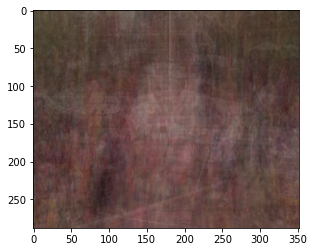

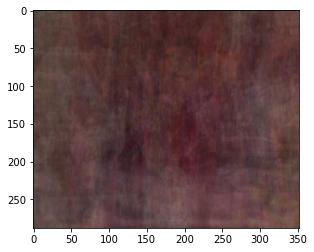

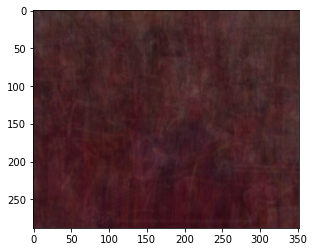

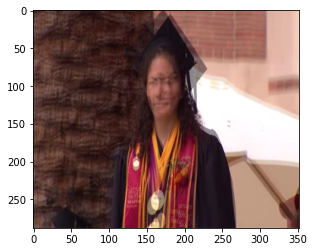

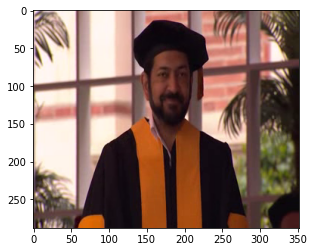

...

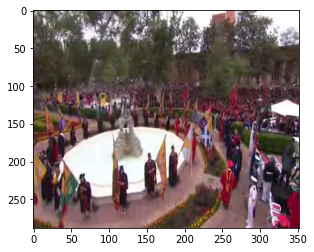

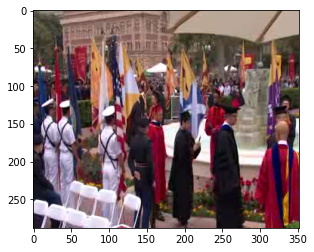

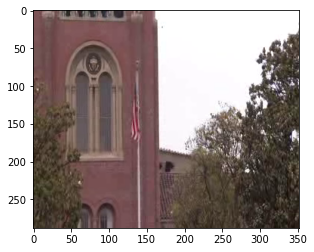

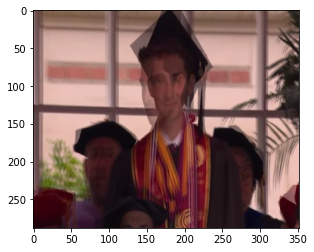

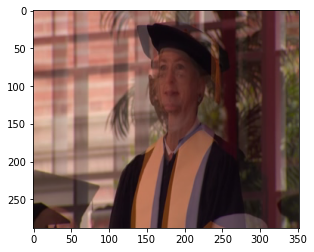

In [40]:
centers = kmeans.cluster_centers_
for center in centers:
    center = center.reshape((288, 352, 3))
    display_rgb_image(center)

In [61]:
import pandas as pd
df = pd.DataFrame()
df['data_index'] = range(0, len(X))
df['cluster'] = kmeans.labels_

In [62]:
df

,data_index,cluster
0,0,7
1,1,0
2,2,11
3,3,9
4,4,1
...,...,...
95,95,1
96,96,0
97,97,0
98,98,2


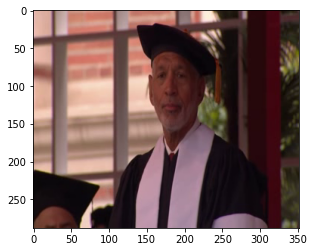

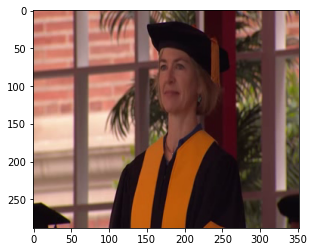

In [87]:
def printClusterImages(cluster):
    images = df.loc[df['cluster'] == cluster]
    for i, row in images.iterrows():
        image = X[row.data_index].reshape((288, 352, 3))
        display_rgb_image(image)

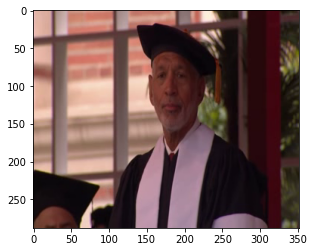

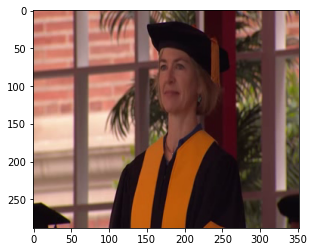

In [88]:
printClusterImages(19) # clusters show a similar background (i.e. cluster 19 -> speaker at podium)

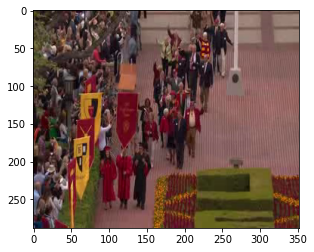

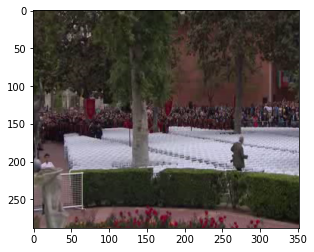

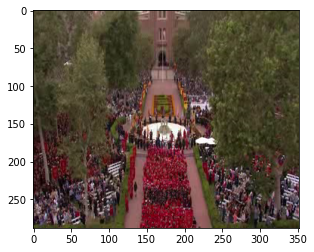

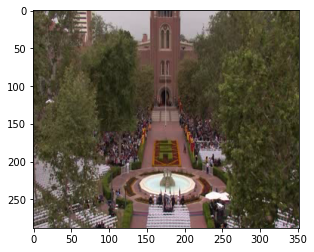

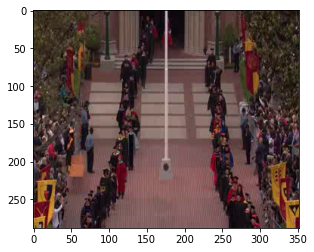

...

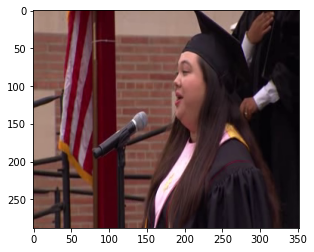

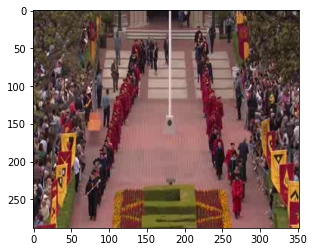

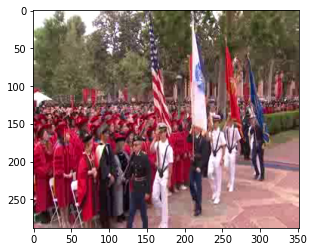

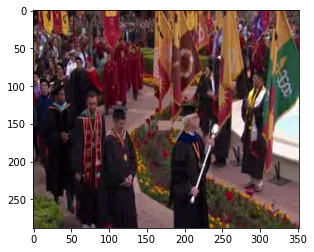

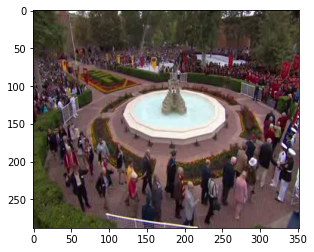

In [89]:
printClusterImages(0) #  cluster 0 -> background images with a lot of people

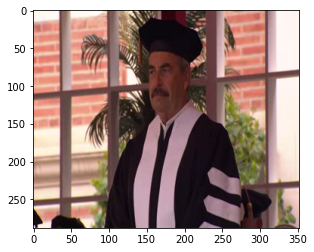

In [91]:
printClusterImages(10) # some centers aren't correctly aligned (for example this should be the same as cluster 19)

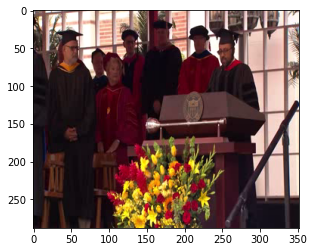

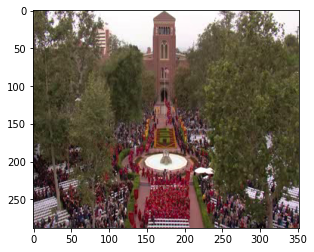

In [92]:
printClusterImages(14) # some clusters random

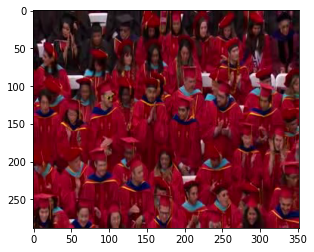

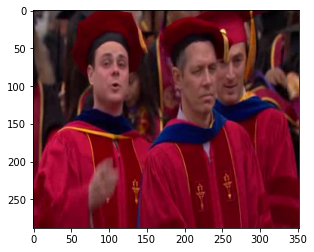

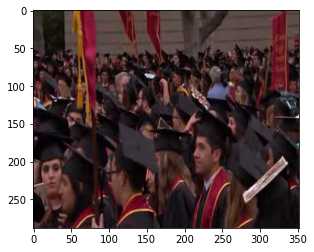

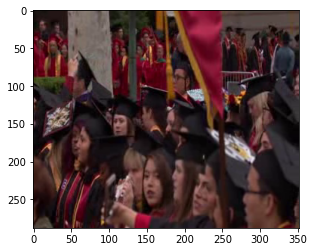

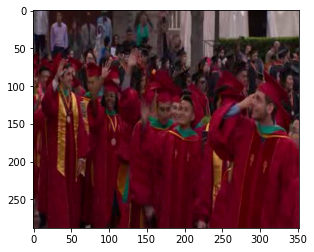

...

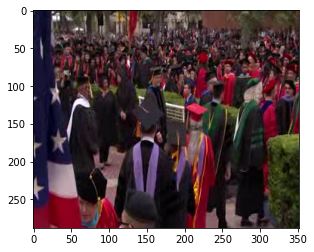

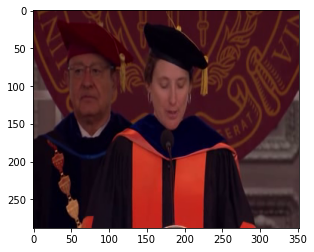

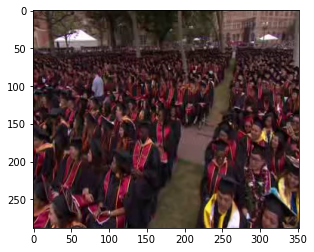

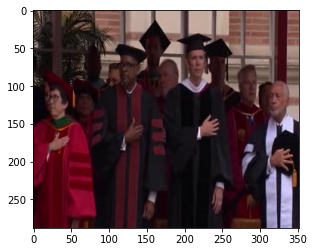

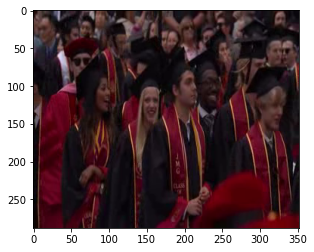

In [96]:
printClusterImages(2) # shows groups of people in cap and gown (red colors)